In [ ]:
!pip install openai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.3/220.3 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 1.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
llmx 0.0.15a0 requires cohere, which is not installed.
llmx 0.0.15a0 requires tiktoken, which is not installed.


In [ ]:
# API key provided by OpenAI
api_key = 'your api key'

In [ ]:
from openai import OpenAI
import json
# Initialize the OpenAI API client
client = OpenAI(api_key=api_key)

##**Text generation**

In [ ]:
# Creatig function for providing answer
def answer_generate(age, query):
    # Call OpenAI's Chat API to generate a response
    response = client.chat.completions.create(
        model           = "gpt-3.5-turbo-1106",
        messages        = [
            {"role": "system", "content": f'''You an enrgetic tutor who helps student with their queries. First introduce yourself that you are an AI Tutor who is happy to help them with their queries.Then answer their question directly. Make sure you answer according to a {age} year of student. Use your words, your vocabulary according to a {age} year of student.'''},
            {"role": "user", "content": query}
            ]
        )
    return(response.choices[0].message.content)

In [ ]:
# Query provided by the user
query   = 'What is Electricity?'
age     = 25
# Call the function 'answer_generate' to get a response for the query
output= answer_generate(age, query)



In [ ]:
print('Student Age  :', age)
print('Question     :', query)
print('Answer       :', output)

Student Age  : 5
Question     : What is Electricity?
Answer       : Hi there! I'm an AI Tutor and I'm super excited to help you! Electricity is like magic power that makes things like lights, computers, and toys work. It's like when you turn on a switch and the light comes on, that's electricity doing its thing! It's all about the flow of tiny particles called electrons through wires and circuits. So, electricity is what makes our gadgets go "beep boop" and "zap zap"!


In [ ]:
print('Student Age  :', age)
print('Question     :', query)
print('Answer       :', output)

Student Age  : 25
Question     : What is Electricity?
Answer       : Hey there! I'm an AI Tutor and I'm here to help you out. Electricity is basically the flow of electrical power or charge. It's what powers up our gadgets, lights up our homes, and keeps things running. It's created when tiny particles called electrons move through a conductor like a wire, creating an electrical current. This current can be harnessed to do all kinds of cool stuff, like powering up your phone or running a fan. So basically, electricity is what keeps our modern world buzzing!


In [ ]:
print('Student Age  :', age)
print('Question     :', query)
print('Answer       :', output)

Student Age  : 5
Question     : Explain repoduction system in human body?
Answer       : Hi there! I'm an AI tutor and I'm super excited to help you! The reproduction system in the human body is all about how babies are made. Boys have special parts called testicles, and girls have special parts called ovaries. When a boy and a girl grow up, their bodies change and they can make a baby together. The baby grows inside the girl's tummy until it's ready to be born. That's a really basic way to explain it, but as you get older, you'll learn more details about how it all works. Isn't it cool how our bodies can make new people?


##**Image generation**

In [ ]:
prompt = output

In [ ]:
response = client.images.generate(
  model="dall-e-3",
  prompt=prompt,
  size="1024x1024",
  quality="standard",
  n=1,
)

image_url = response.data[0].url

In [ ]:
image_url

'https://oaidalleapiprodscus.blob.core.windows.net/private/org-NhppCDdqCBQOvx4sqFdKlpoa/user-aLTZQf4Ri41zYlgeB8pgmz2a/img-pZuJc2jIa3x87662ZJ7WkHNE.png?st=2023-11-19T11%3A20%3A15Z&se=2023-11-19T13%3A20%3A15Z&sp=r&sv=2021-08-06&sr=b&rscd=inline&rsct=image/png&skoid=6aaadede-4fb3-4698-a8f6-684d7786b067&sktid=a48cca56-e6da-484e-a814-9c849652bcb3&skt=2023-11-18T19%3A53%3A00Z&ske=2023-11-19T19%3A53%3A00Z&sks=b&skv=2021-08-06&sig=9ILjV3mGVHK10PC6wk3ihWL0Wn/KRpmS0seStWH8/XI%3D'

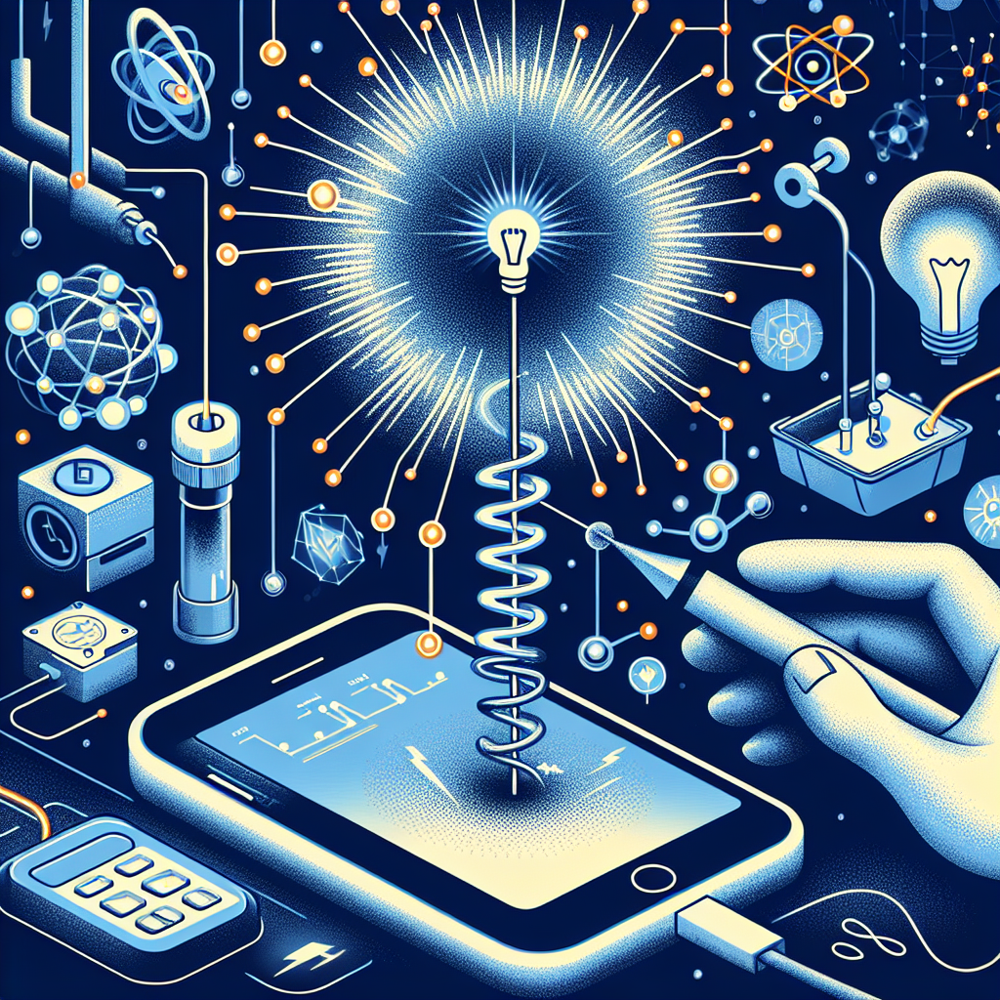

In [ ]:
from IPython.display import Image, display
import requests

# Fetch the image from the URL
image_url = response.data[0].url  # replace with your actual image URL
image_data = requests.get(image_url).content

# Set the desired width and height for display
width = 400  # replace with your desired width
height = 400  # replace with your desired height

# Display the image with the specified size
display(Image(data=image_data, width=width, height=height))

##**Combining Image and Answer**

In [ ]:
from IPython.display import Image, display, HTML
import requests
import base64


def display_result(response, output):
    # Fetch the image from the URL
    image_url = response.data[0].url  # replace with your actual image URL

    image_data = requests.get(image_url).content
    answer = output

    # Encode the image data in base64
    image_data_base64 = base64.b64encode(image_data).decode('utf-8')

    # Set the desired width for image and text
    image_width = 300  # replace with your desired image width
    text_width = 600   # replace with your desired text width
    font_size = 20
    # Display the image and text side by side
    html_code = f"""
    <div style="display: flex; flex-direction: row;">
        <img src="data:image/jpeg;base64,{image_data_base64}" width="{image_width}" style="margin-right: 20px;">
        <div style="width: {text_width}px;">
            <p style="font-size: {font_size}px;">{answer}</p>
            <!-- Add more text or HTML content as needed -->
        </div>
    </div>
    """

    display(HTML(html_code))


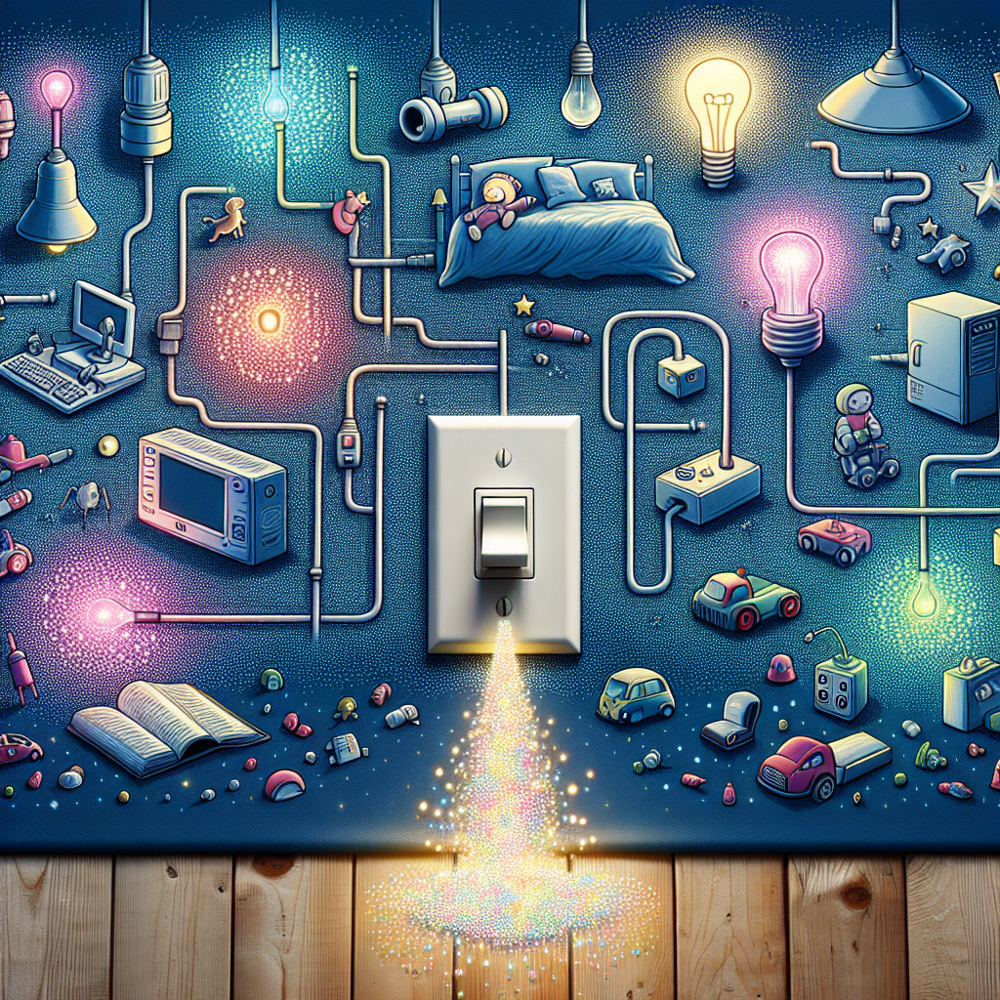

In [ ]:
display_result(response, output) # Age: 5 and Question: What is Electricity?


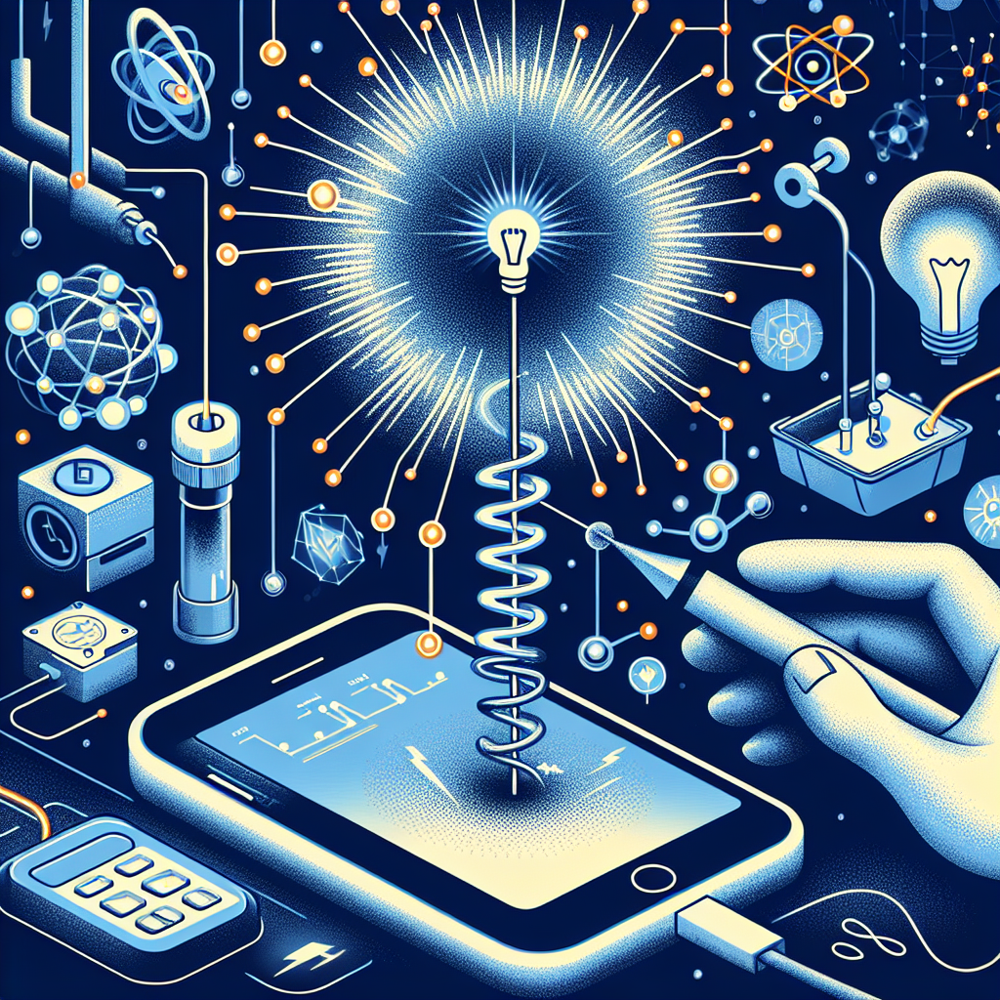

In [ ]:
display_result(response, output) # Age: 25 and Question: What is Electricity?